In [1]:
%%time
import numpy as np
import scanpy as sc
import os
import pandas as pd
import bbknn
import seaborn as sns
import matplotlib.pyplot as plt

sc.settings.verbosity = 4                
sc.settings.set_figure_params(80)                 
sc.settings.file_format_figures = 'pdf'  
sc.settings.savefigs = False            
use_first_n_samples = 0
full_sparse = False

Wall time: 16.5 s


# Complement spatial analysis

In [3]:
locs = pd.read_csv(r"C:\Users\TzachiHNB5\Documents\Project_barrier_immune\scanpy\scanpy_bat1k\bat1klocs_to_eggnog.csv")
locsdict = dict(zip(locs.bat_gene_name,locs.eggnog_name))

In [5]:
adata=sc.read("C:\\Users\\TzachiHNB5\\Documents\\Project_barrier_immune\\scanpy\\scanpy_bat1k\\spatial\\raw_afterqc_and_filtration\\adatad.h5ad")
adata.var.index=adata.var.index.str.upper()
adata.var.rename(index=locsdict,inplace=True)
adata.var.rename(index={'LOC107504266':'DEFA5_LOC107504266'},inplace=True)
d_slice = pd.read_csv(r'C:\Users\TzachiHNB5\Documents\Project_barrier_immune\scanpy\gut_analysis\Spatial_ann\Slice2D.csv',index_col=0)
adata = adata[adata.obs.index.isin(d_slice.index)]
sc.pp.normalize_total(adata, target_sum=10000)
sc.pp.log1p(adata)
adata.raw = adata
sc.pp.scale(adata)
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata, key_added="clusters",resolution=1.4)

normalizing counts per cell
    finished (0:00:00)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


c:\users\tzachihnb5\appdata\local\programs\python\python39\lib\site-packages\scanpy\preprocessing\_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


computing PCA
    with n_comps=50
    finished (0:00:04)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)
computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 50
    computed neighbors (0:00:00)
    computed connectivities (0:00:01)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:02)
ru

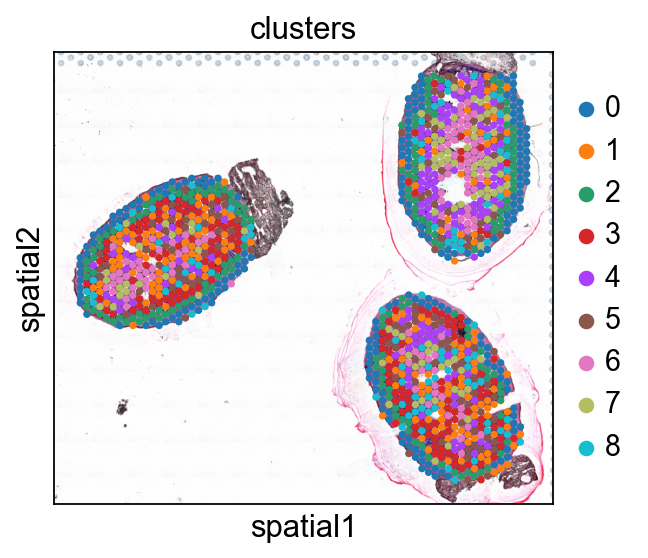

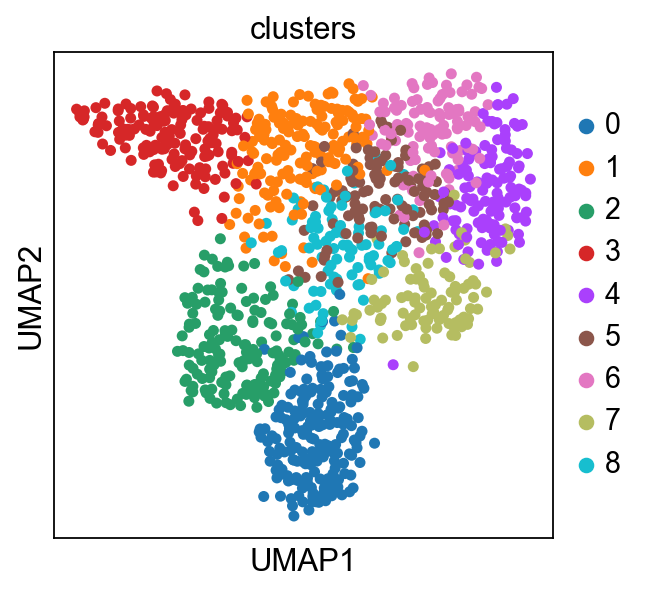

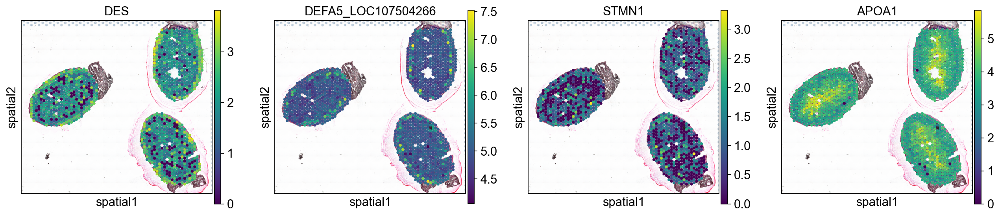

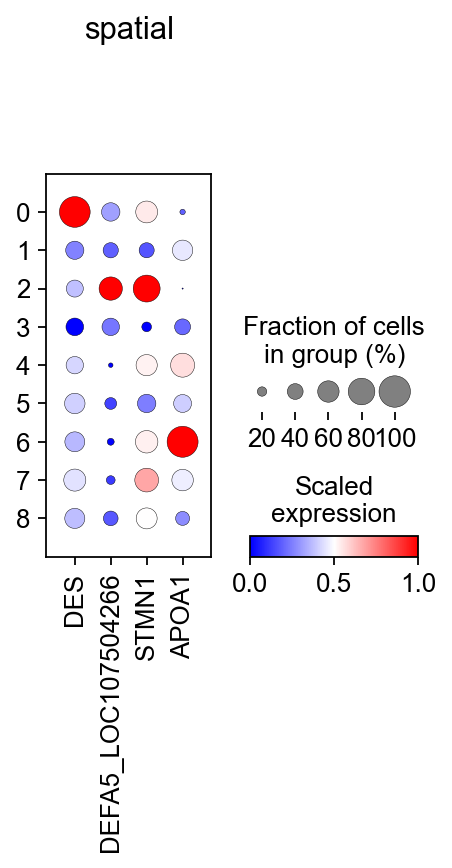

In [7]:
import matplotlib.pyplot as plt
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

sc.pl.spatial(adata, img_key="hires", color=['clusters'], size=1.5,save='spatial_complement_clusters_spatialmap.pdf')
sc.pl.umap(adata,color='clusters',save='spatial_complement_clusters_umap.pdf')
sc.pl.spatial(adata, img_key="hires", color=['DES','DEFA5_LOC107504266','STMN1','APOA1'], size=1.5,save='spatial_complement_markers_spatialmap.pdf')
sc.pl.dotplot(adata,['DES','DEFA5_LOC107504266','STMN1','APOA1'],cmap='bwr',colorbar_title='Scaled\nexpression',groupby='clusters', standard_scale='var',title='spatial',use_raw=False,save='spatial_complement_clusters_markers_dotplot.pdf')


In [8]:
clusters_ann = {'0':'Intestinal wall','2':'Crypt','4':'Villus','6':'Villus'}
 # 0  -Submucosa ,Muscular layer, serosa
adata.obs['area'] = adata.obs.clusters.map(clusters_ann).astype('category')

# DE for area

In [9]:
# DE for area - >adata2 includes only the annotated spots so other spots will not be included in the DE analysis
adata2 = adata[adata.obs.area.isna()==False].copy()

ranking genes
    consider 'area' groups:
    with sizes: [161 208 237]
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


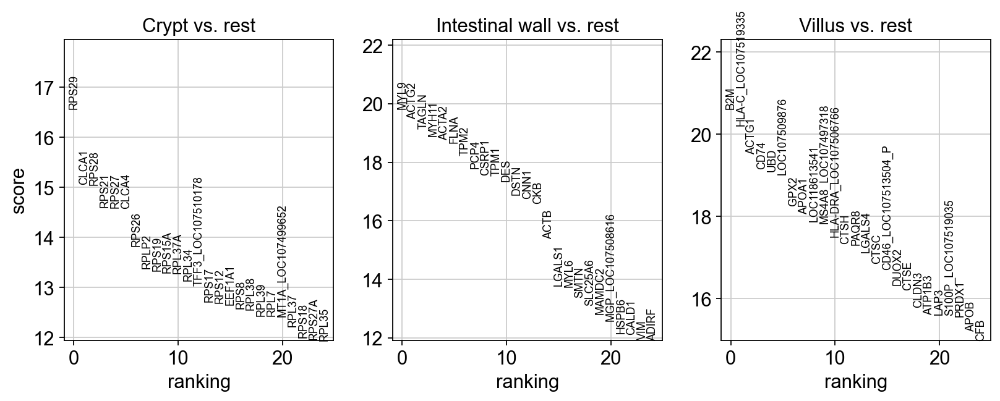

In [10]:
sc.tl.rank_genes_groups(adata2, 'area', method='wilcoxon') # Can also be 'cell_type' once annotated
sc.pl.rank_genes_groups(adata2, n_genes=25, sharey=False)
pd.set_option("display.max_columns", None)
pd.DataFrame(adata2.uns['rank_genes_groups']['names']).head(20)
result = adata2.uns['rank_genes_groups']
groups = result['names'].dtype.names
DE_clusters = pd.DataFrame(
{group + '_' + key[:]: result[key][group]
for group in groups for key in ['names','logfoldchanges','pvals','pvals_adj']})
DE_clusters.to_csv(r"area_De.csv")

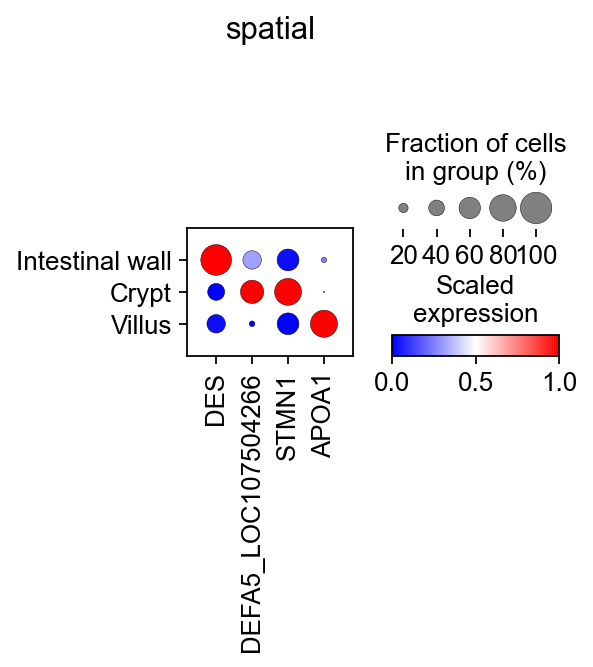

In [13]:
sc.pl.dotplot(adata,['DES','DEFA5_LOC107504266','STMN1','APOA1'],categories_order=['Intestinal wall','Crypt','Villus'],cmap='bwr',groupby='area', standard_scale='var',title='spatial',use_raw=False,colorbar_title='Scaled\nexpression',save='dotplot_spatial_complement_area_markers_dotplot.pdf')

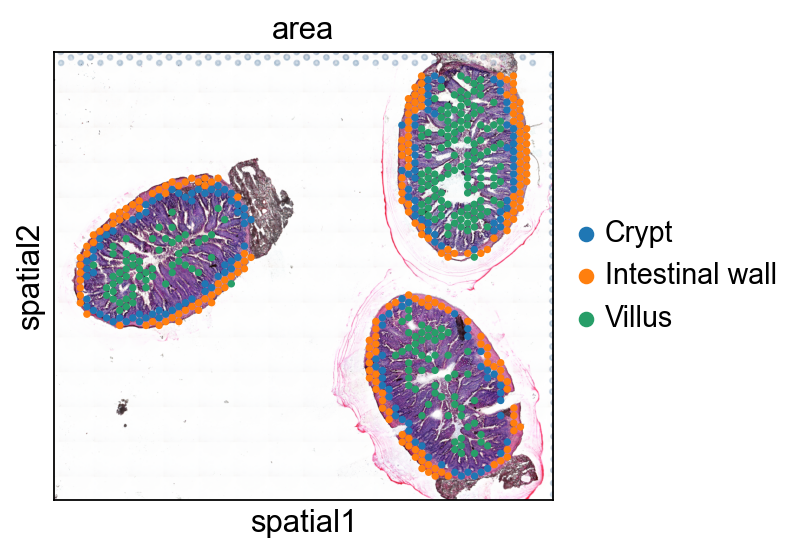

In [15]:
import matplotlib.pyplot as plt
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

sc.pl.spatial(adata2, img_key="hires", color=['area'], size=1.5,save='spatial_complement_area_umap.pdf')


In [16]:
dem = sc.get.rank_genes_groups_df(adata2, group="Intestinal wall",log2fc_min=0,pval_cutoff=0.05)
dem.set_index('names',inplace=True)
dec = sc.get.rank_genes_groups_df(adata2, group="Crypt",log2fc_min=0,pval_cutoff=0.05)
dec.set_index('names',inplace=True)
dev = sc.get.rank_genes_groups_df(adata2, group="Villus",log2fc_min=0,pval_cutoff=0.05)
dev.set_index('names',inplace=True)

In [17]:
excel = {'Intestinal wall':dem,'Crypt':dec,'Villus':dev}

In [18]:
def save_excel(excel,sheet_names,path):
    writer = pd.ExcelWriter(path, engine='xlsxwriter')
    for i in range(0,len(excel)):
        excel[sheet_names[i]].to_excel(writer,sheet_name=sheet_names[i])

    writer.close()

In [19]:
path = 'area_DE.xlsx'
save_excel(excel,list(excel.keys()),path)

In [25]:
print('Villus')
print(dev[dev.index.isin(['CFD','C5','C6','C7','C8G'])].pvals)
print('\n\nCrypt')
print(dec[dec.index.isin(['CFD','C5','C6','C7','C8G'])].pvals)
print('\n\nIntestinal wall')
print(dem[dem.index.isin(['CFD','C5','C6','C7','C8G'])].pvals)

Villus
names
C8G    4.825458e-09
Name: pvals, dtype: float64


Crypt
names
C5    3.936647e-20
C6    1.848302e-17
C7    1.725663e-04
Name: pvals, dtype: float64


Intestinal wall
names
CFD    0.000459
Name: pvals, dtype: float64


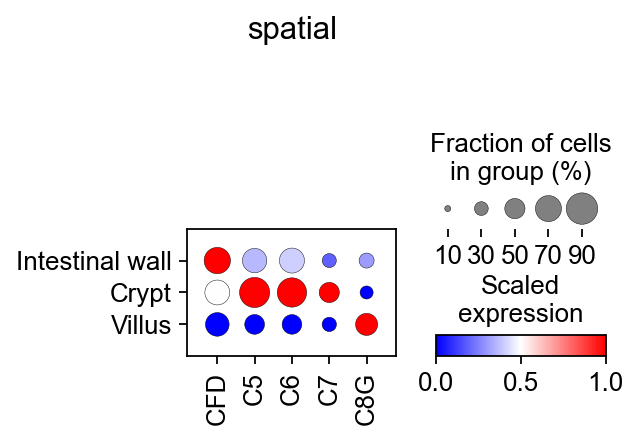

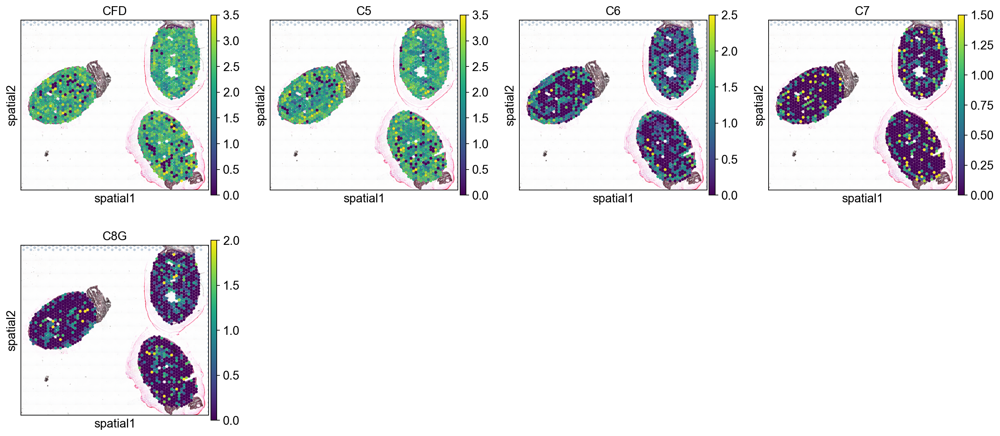

In [26]:
import matplotlib.pyplot as plt
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42
sc.pl.dotplot(adata,['CFD','C5','C6','C7','C8G'],categories_order=['Intestinal wall','Crypt','Villus'],cmap='bwr',groupby='area', standard_scale='var',title='spatial',use_raw=False,var_group_rotation=0,colorbar_title='Scaled\nexpression',save='dotplot_coplement_genes.pdf')
sc.pl.spatial(adata, img_key="hires", color=['CFD','C5','C6','C7','C8G'], size=1.5,vmax=[3.5,3.5,2.5,1.5,2],save='complement_genes_spatial_map_bat.pdf')

In [27]:
forfig = ['C1R', 'C1S','MASP1', 'MASP2', 'C2', 'CFB', 'CFD', 'CFI','C3','C4A_LOC107498435','C5','C6','C7','C8A','C8B','C8G','C9']
lim = [2.5,2.5,2,2,3,4,3.5,2.5,4,4,3,2,1.5,2,2,2,2] # For more balanced visualization

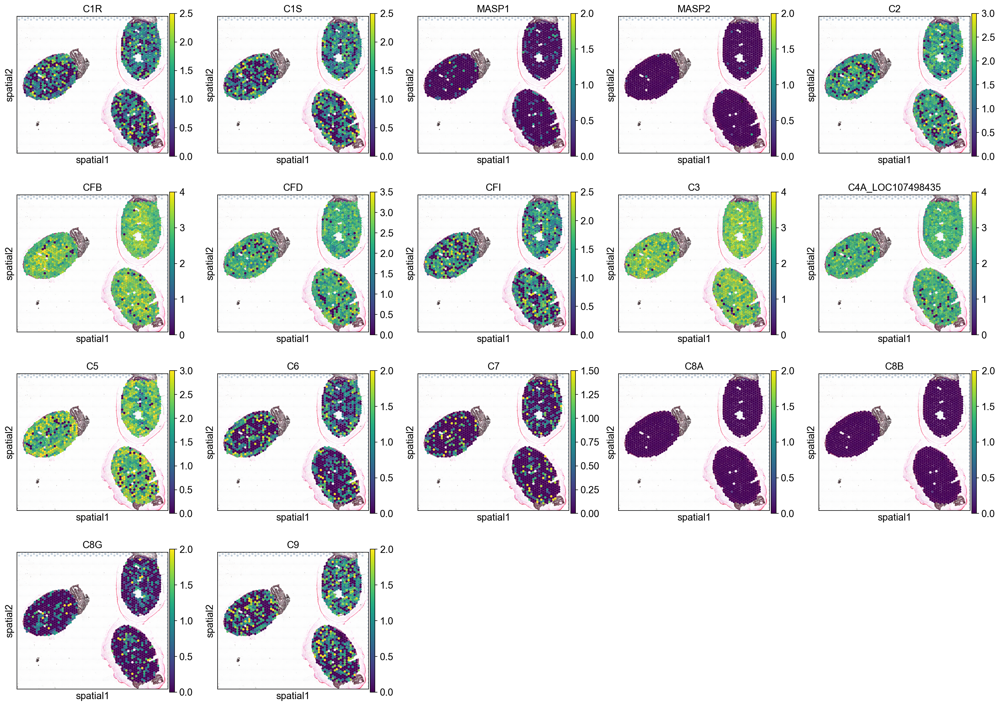

In [28]:
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42
sc.pl.spatial(adata, img_key="hires", color=forfig, size=1.5,ncols = 5,vmax=lim,save= 'complement_expression_more_genes.pdf')

In [ ]:
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42
sc.pl.spatial(adata, img_key="hires", color=forfig, size=1.5,)save= 'complement_expression_more_genes.pdf')

# Mouse complement expression 

In [29]:
file_names  = ['slide1_small_raw','slide2_small_raw'] 

mainpath = r'C:\\Users\\TzachiHNB5\\Documents\\Project_barrier_immune\\scanpy\\gut_analysis\\mouse_Spatial\\'
bdatas = []

for file in file_names[:2]:
    bdata = sc.read_visium(mainpath+file)

    bdata.var['Ensembl'] = bdata.var.index.copy()
    bdata.var.index = bdata.var.index.str.upper()
    sc.pp.normalize_total(bdata, )
    sc.pp.log1p(bdata)
    sc.pp.scale(bdata, max_value=10)
    sc.tl.pca(bdata, svd_solver='arpack')
    sc.pp.neighbors(bdata)
    sc.tl.umap(bdata)    
    bdatas.append(bdata)

reading C:\Users\TzachiHNB5\Documents\Project_barrier_immune\scanpy\gut_analysis\mouse_Spatial\slide1_small_raw\filtered_feature_bc_matrix.h5
 (0:00:00)


c:\users\tzachihnb5\appdata\local\programs\python\python39\lib\site-packages\anndata\_core\anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


normalizing counts per cell
    finished (0:00:00)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
    ... clipping at max_value 10
computing PCA
    with n_comps=50
    finished (0:00:07)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)
computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 50
    computed neighbors (0:00:00)
    computed connectivities (0:00:00)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  50

c:\users\tzachihnb5\appdata\local\programs\python\python39\lib\site-packages\anndata\_core\anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


normalizing counts per cell
    finished (0:00:00)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
    ... clipping at max_value 10
computing PCA
    with n_comps=50
    finished (0:00:10)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)
computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 50
    computed neighbors (0:00:00)
    computed connectivities (0:00:00)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  50

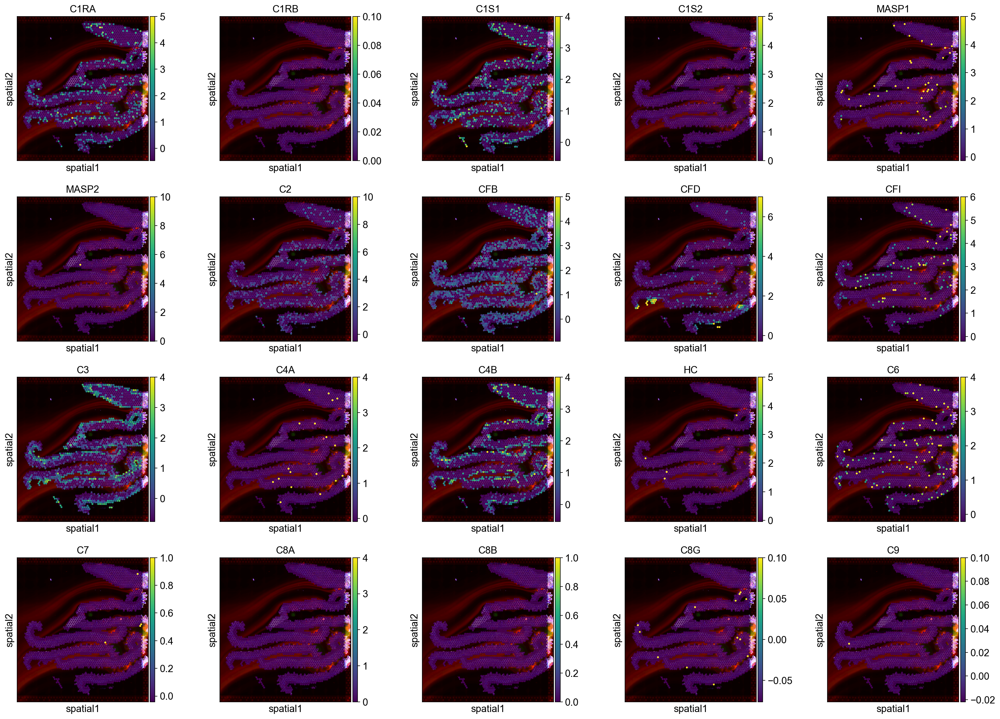

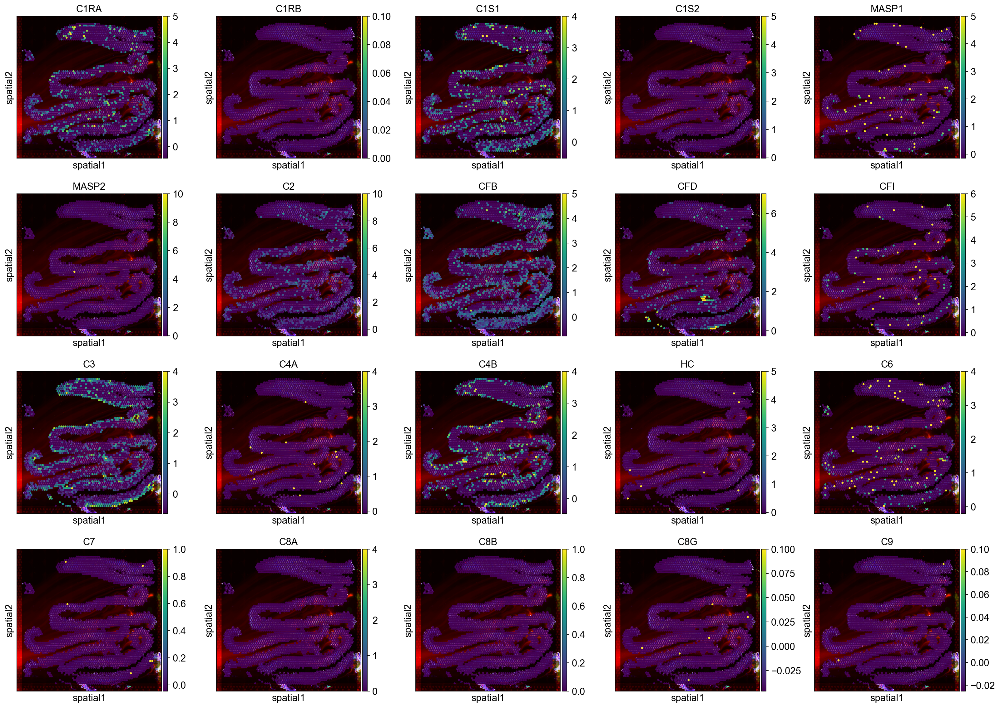

In [30]:
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42
vmax= [5,0.1,4,5,5,10,10,5,7,6,4,4,4,5,4,1,4,1,0.1,0.1,1,1] # For balanced visual
forfig_all = ['C1RA','C1RB', 'C1S1','C1S2','MASP1', 'MASP2', 'C2', 'CFB', 'CFD', 'CFI','C3','C4A','C4B','HC','C6','C7','C8A','C8B','C8G','C9']
sc.pl.spatial(bdatas[0], img_key="hires", color=[i for i in forfig_all if i in bdatas[0].var_names],vmax=vmax, size=1.5,ncols=5,save= 'complement_expression_more_genes_mouse_slice1.pdf',)
sc.pl.spatial(bdatas[1], img_key="hires", color=[i for i in forfig_all if i in bdatas[1].var_names],vmax=vmax, size=1.5,ncols=5,save= 'complement_expression_more_genes_mouse_slice2.pdf',)

In [41]:
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42
sc.pl.spatial(bdatas[0], img_key="hires", color=[i for i in forfig if i in bdatas[0].var_names],vmax=lim, size=1.5,save= 'complement_expression_more_genes_mouse_slice1.pdf',use_raw=False)
print([i for i in forfig if i not in bdatas[0].var_names])
sc.pl.spatial(bdatas[1], img_key="hires", color=[i for i in forfig if i in bdatas[1].var_names],vmax=lim, size=1.5,save= 'complement_expression_more_genes_mouse_slice2.pdf',use_raw=False)
print([i for i in forfig if i not in bdatas[1].var_names])